# Downstream Analysis of Deconvolution Results


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip install --quiet scvi-colab
    from scvi_colab import install
    install()
    !pip install --quiet git+https://github.com/BayraktarLab/cell2location#egg=cell2location[tutorials]

INFO     scvi-colab: Installing scvi-tools.                                                                        
INFO     scvi-colab: Install successful. Testing import.                                                           
DEPRECATION: git+https://github.com/BayraktarLab/cell2location#egg=cell2location[tutorials] contains an egg fragment with a non-PEP 508 name pip 25.0 will enforce this behaviour change. A possible replacement is to use the req @ url syntax, and remove the egg fragment. Discussion can be found at https://github.com/pypa/pip/issues/11617
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [3]:
import sys
import pickle
import scanpy as sc
import anndata
import numpy as np
import os
import pandas as pd
import seaborn as sns

import cell2location

import matplotlib as mpl
from matplotlib import pyplot as plt

# scanpy prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

## Load Deconvolution Results

In [5]:
results_folder = '/content/drive/MyDrive/STEMREM205_Group_Project/Cell2Loc/results_belgian_cohort/'
run_name = f'{results_folder}cell2location_map'

regression_model_output = 'reference_signatures'
reg_path = f'{results_folder}{regression_model_output}/'

In [6]:
sp_data_file = f'{run_name}/sp.h5ad'

adata_vis = sc.read_h5ad(sp_data_file)

mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

INFO     File                                                                                                      
         /content/drive/MyDrive/STEMREM205_Group_Project/Cell2Loc/results_belgian_cohort/cell2location_map/model.pt
         already downloaded                                                                                        


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:lightning.pytorch.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly 

Epoch 1/30000:   0%|          | 1/30000 [00:02<22:37:06,  2.71s/it, v_num=1]

INFO: `Trainer.fit` stopped: `max_steps=1` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/30000:   0%|          | 1/30000 [00:02<22:50:08,  2.74s/it, v_num=1]


In [ ]:
adata_vis

AnnData object with n_obs × n_vars = 19443 × 12697
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'genome', 'mt', 'n_cells_by_counts-SN048_A121573_Rep1', 'mean_counts-SN048_A121573_Rep1', 'log1p_mean_counts-SN048_A121573_Rep1', 'pct_dropout_by_counts-SN048_A121573_Rep1', 'total_counts-SN048_A121573_Rep1', 'log1p_total_counts-SN048_A121573_Rep1', 'n_cells_by_counts-SN048_A121573_Rep2', 'mean_counts-SN048_A121573_Rep2', 'log1p_mean_counts-SN048_A121573_Rep2', 'pct_dropout_by_counts-SN048_A121573_Rep2', 'total_counts-SN048_A121573_Rep2', 'log1p_total_counts-SN048_A121573_Rep2', 'n_cells_by_counts-SN048_A416371_Rep1', 'mean_counts-SN048_A416371_Rep1', 'log1p_mean_counts-SN048_A416371_Rep1', 'pct_

In [ ]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,_indices,_scvi_batch,_scvi_labels
spot_id,,,,,,,,,,,,,,,,
SN048_A121573_Rep1_AAACAAGTATCTCCCA-1,1,50,102,SN048_A121573_Rep1,5341,8.583355,17364.0,9.762212,25.662290,33.920756,43.221608,54.947017,0.028680,0,0,0
SN048_A121573_Rep1_AAACACCAATAACTGC-1,1,59,19,SN048_A121573_Rep1,5674,8.643826,22320.0,10.013283,28.369176,38.342294,47.974910,59.605735,0.083378,1,0,0
SN048_A121573_Rep1_AAACATTTCCCGGATT-1,1,61,97,SN048_A121573_Rep1,3170,8.061802,7669.0,8.945072,24.149172,33.224671,43.160777,57.034815,0.060112,2,0,0
SN048_A121573_Rep1_AAACCCGAACGAAATC-1,1,45,115,SN048_A121573_Rep1,6756,8.818334,27100.0,10.207326,19.712177,27.811808,36.878229,49.793358,0.033727,3,0,0
SN048_A121573_Rep1_AAACCGGGTAGGTACC-1,1,42,28,SN048_A121573_Rep1,4295,8.365440,12265.0,9.414586,23.742356,32.768039,41.956788,54.969425,0.077782,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN124_A938797_Rep2_TTGTGGCCCTGACAGT-1,1,18,60,SN124_A938797_Rep2,5932,8.688285,21543.0,9.977853,23.761779,32.530288,42.552105,55.331198,0.021353,19438,12,0
SN124_A938797_Rep2_TTGTTAGCAAATTCGA-1,1,22,42,SN124_A938797_Rep2,6011,8.701513,22686.0,10.029548,23.239002,31.138147,41.369126,55.108878,0.014502,19439,12,0
SN124_A938797_Rep2_TTGTTCAGTGTGCTAC-1,1,24,64,SN124_A938797_Rep2,5444,8.602453,17600.0,9.775711,22.823864,31.090909,40.971591,53.619318,0.013636,19440,12,0


In [ ]:
adata_vis.var

,feature_types,genome,mt,n_cells_by_counts-SN048_A121573_Rep1,mean_counts-SN048_A121573_Rep1,log1p_mean_counts-SN048_A121573_Rep1,pct_dropout_by_counts-SN048_A121573_Rep1,total_counts-SN048_A121573_Rep1,log1p_total_counts-SN048_A121573_Rep1,n_cells_by_counts-SN048_A121573_Rep2,...,log1p_mean_counts-SN84_A120838_Rep1,pct_dropout_by_counts-SN84_A120838_Rep1,total_counts-SN84_A120838_Rep1,log1p_total_counts-SN84_A120838_Rep1,n_cells_by_counts-SN84_A120838_Rep2,mean_counts-SN84_A120838_Rep2,log1p_mean_counts-SN84_A120838_Rep2,pct_dropout_by_counts-SN84_A120838_Rep2,total_counts-SN84_A120838_Rep2,log1p_total_counts-SN84_A120838_Rep2
SYMBOL,,,,,,,,,,,,,,,,,,,,,
A1BG,Gene Expression,GRCh38,False,175,0.086246,0.082728,92.056287,190.0,5.252274,176,...,0.213340,82.317073,78.0,4.369448,87,0.089695,0.085898,91.698473,94.0,4.553877
A1CF,Gene Expression,GRCh38,False,459,0.255561,0.227582,79.164775,563.0,6.335054,362,...,0.059189,94.512195,20.0,3.044523,65,0.064885,0.062867,93.797710,68.0,4.234107
A2M,Gene Expression,GRCh38,False,1814,3.032683,1.394432,17.657739,6681.0,8.807173,1838,...,1.367832,18.292683,960.0,6.867974,688,2.047710,1.114390,34.351145,2146.0,7.671827
A2ML1,Gene Expression,GRCh38,False,1,0.000454,0.000454,99.954607,1.0,0.693147,0,...,0.000000,100.000000,0.0,0.000000,0,0.000000,0.000000,100.000000,0.0,0.000000
A4GALT,Gene Expression,GRCh38,False,210,0.103495,0.098483,90.467544,228.0,5.433722,211,...,0.322879,74.085366,125.0,4.836282,143,0.182252,0.167421,86.354962,191.0,5.257495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZWILCH,Gene Expression,GRCh38,False,526,0.303223,0.264840,76.123468,668.0,6.505784,487,...,0.167992,83.841463,60.0,4.110874,107,0.109733,0.104119,89.790076,115.0,4.753590
ZWINT,Gene Expression,GRCh38,False,647,0.394008,0.332183,70.630958,868.0,6.767343,678,...,0.268443,76.524390,101.0,4.624973,228,0.254771,0.226953,78.244275,267.0,5.590987
ZYG11B,Gene Expression,GRCh38,False,401,0.208806,0.189633,81.797549,460.0,6.133398,410,...,0.275412,75.304878,104.0,4.653960,270,0.309160,0.269386,74.236641,324.0,5.783825


## Visualising cell abundance in spatial coordinates
Using 5% quantile of the posterior distribution, representing the value of cell abundance that the model has high confidence in (aka ‘at least this amount is present’).

In [ ]:
#adata_vis = mod.export_posterior(
#    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs}
#)
#mod.plot_QC()

In [ ]:
#adata_vis.uns['mod']

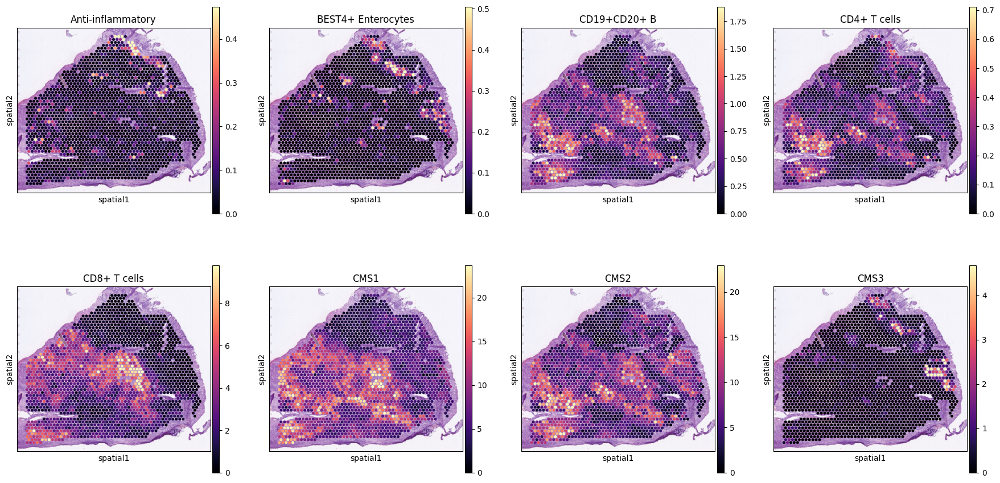

In [ ]:
# Change the cell types as needed

# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

# select one slide
from cell2location.utils import select_slide
slide = select_slide(adata_vis, 'SN048_A416371_Rep2')

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(slide, cmap='magma',
                  # show first 8 cell types
                  color=['Anti-inflammatory', 'BEST4+ Enterocytes',
                         'CD19+CD20+ B', 'CD4+ T cells', 'CD8+ T cells',
                         'CMS1', 'CMS2', 'CMS3'],
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2'
                 )

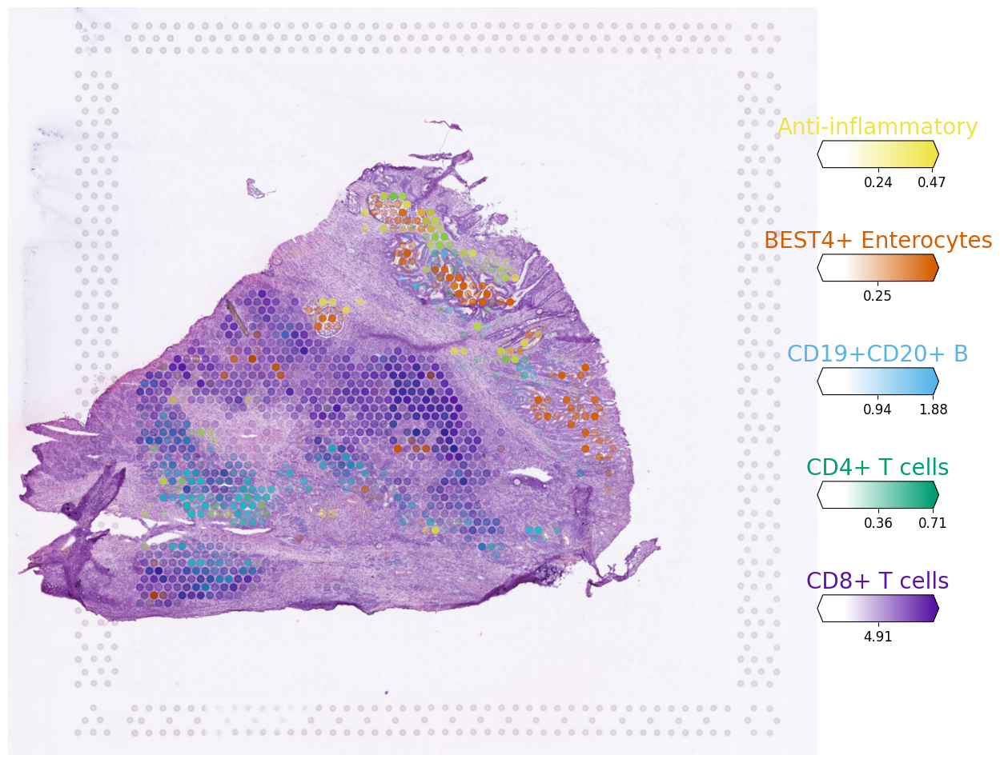

In [ ]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['Anti-inflammatory', 'BEST4+ Enterocytes',
                'CD19+CD20+ B', 'CD4+ T cells', 'CD8+ T cells']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_vis, 'SN048_A416371_Rep2')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )


## Identifying discrete tissue regions by Leiden clustering

In [ ]:
# compute KNN using the cell2location output stored in adata.obsm
sc.pp.neighbors(adata_vis, use_rep='q05_cell_abundance_w_sf',
                n_neighbors = 15)

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=1.1)

# add region as categorical variable
adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"].astype("category")

We can use the location composition similarity graph to build a joint integrated UMAP representation of all section/Visium batches.

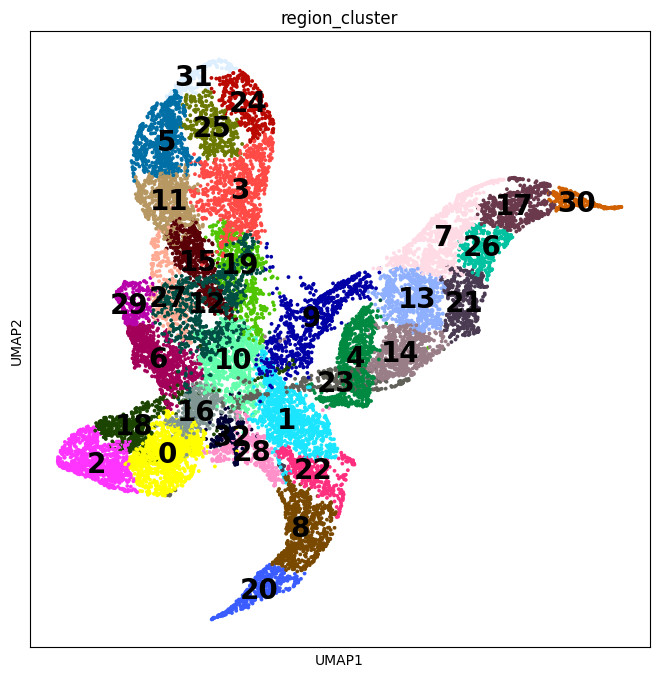

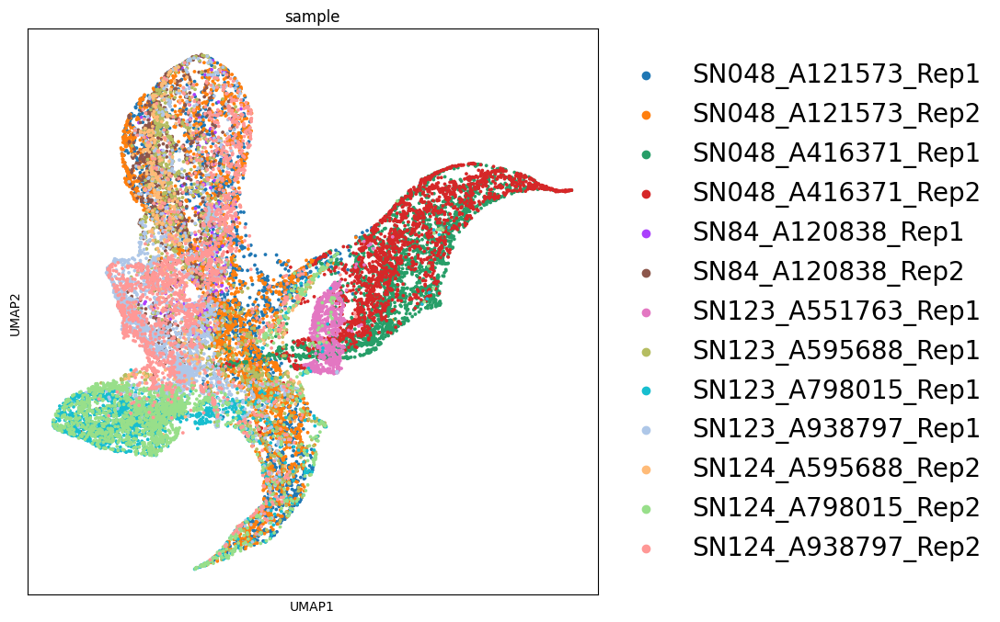

In [ ]:
# compute UMAP using KNN graph based on the cell2location output
sc.tl.umap(adata_vis, min_dist = 0.3, spread = 1)

# show regions in UMAP coordinates
with mpl.rc_context({'axes.facecolor':  'white',
                     'figure.figsize': [8, 8]}):
    sc.pl.umap(adata_vis, color=['region_cluster'], size=30,
               color_map = 'RdPu', ncols = 2, legend_loc='on data',
               legend_fontsize=20)
    sc.pl.umap(adata_vis, color=['sample'], size=30,
               color_map = 'RdPu', ncols = 2,
               legend_fontsize=20)


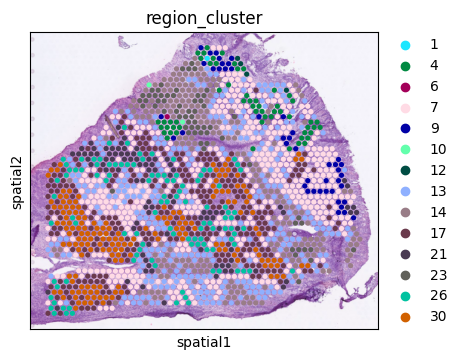

In [ ]:
# plot in spatial coordinates

slide = select_slide(adata_vis, 'SN048_A416371_Rep2')

with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(slide, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=1) # can change alpha

## Identifying cellular compartments / tissue zones using matrix factorisation (NMF)

In [ ]:
from cell2location import run_colocation
res_dict, adata_vis = run_colocation(
    adata_vis,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(11, 13), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/CoLocatedComb/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_19443locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_19443locations_40factors


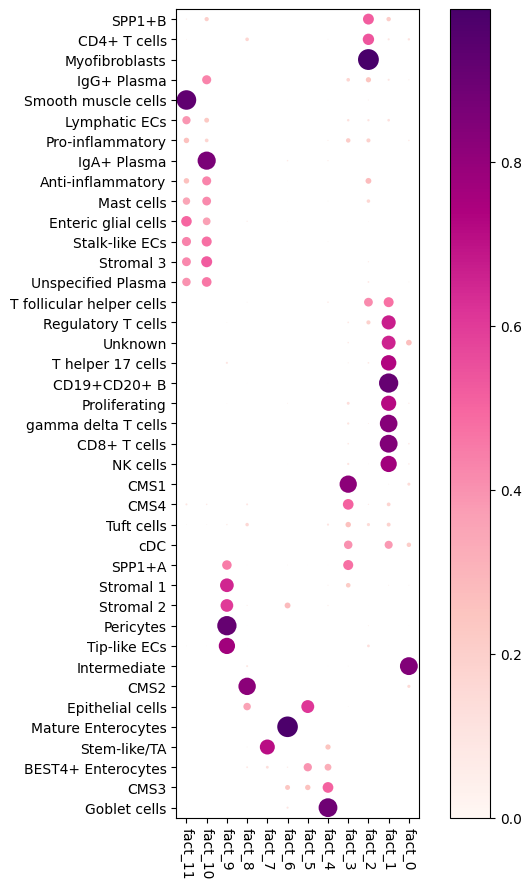

In [ ]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact12']['mod'].plot_cell_type_loadings()

Looking at cellular compartments/tissue zones from liver met vs no liver met

In [7]:
liver_met_samples = ['SN048_A121573_Rep1', 'SN048_A121573_Rep2',
                     'SN123_A551763_Rep1', 'SN123_A595688_Rep1',
                     'SN124_A595688_Rep2']

def is_liver_met(sample_name):
    # Check if the sample_name is in the list of lymph_node_met_samples
    if sample_name in liver_met_samples:
        return 1
    else:
        return 0

In [8]:
adata_vis.obs['liver_metastasis'] = adata_vis.obs['sample'].apply(is_liver_met)

In [9]:
lymph_node_met_samples = ['SN048_A121573_Rep1', 'SN048_A121573_Rep2',
                          'SN048_A416371_Rep1', 'SN048_A416371_Rep2',
                          'SN84_A120838_Rep1', 'SN84_A120838_Rep2',
                          'SN123_A551763_Rep1', 'SN123_A595688_Rep1',
                          'SN124_A595688_Rep2']

def is_node_pos(sample_name):
    # Check if the sample_name is in the list of lymph_node_met_samples
    if sample_name in lymph_node_met_samples:
        return 1
    else:
        return 0

adata_vis.obs['lymph_node_metastasis'] = adata_vis.obs['sample'].apply(is_node_pos)

In [10]:
# LN mets
adata_LN_met = adata_vis[adata_vis.obs['lymph_node_metastasis'] == 1].copy()
adata_LN_neg = adata_vis[adata_vis.obs['lymph_node_metastasis'] == 0].copy()

# Liver mets
adata_liver_met = adata_vis[adata_vis.obs['liver_metastasis'] == 1].copy()
adata_liver_neg = adata_vis[(adata_vis.obs['liver_metastasis'] == 0) & (adata_vis.obs['lymph_node_metastasis'] == 1)].copy()

Liver metastasis cellular compartments/tissue zones

In [ ]:
from cell2location import run_colocation
liver_met_res_dict, adata_liver_met = run_colocation(
    adata_liver_met,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/liver_met/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_6846locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_6846locations_40factors


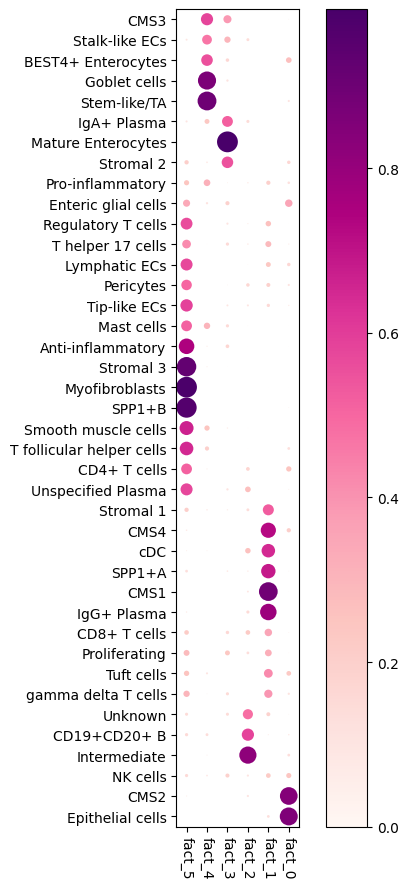

In [ ]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
liver_met_res_dict['n_fact6']['mod'].plot_cell_type_loadings()

Plot these abundant cell types in samples spatially

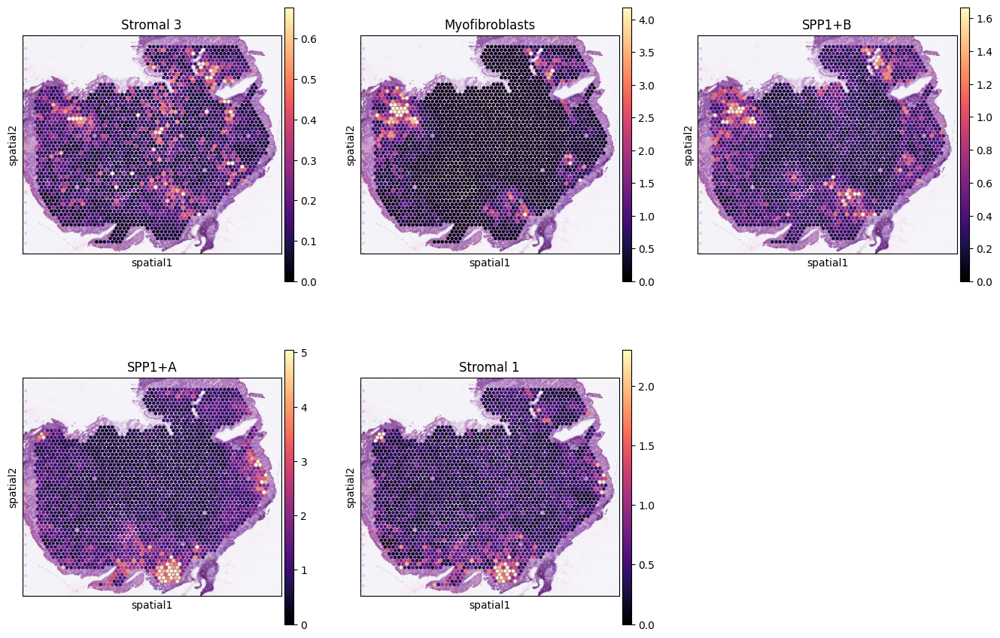

In [ ]:
# FOR A SAMPLE WITH LYMPH NODE POS + LIVER MET POS

# add 95% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q95_cell_abundance_w_sf']

# select one slide
from cell2location.utils import select_slide
slide = select_slide(adata_vis, 'SN048_A121573_Rep2')

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(slide, cmap='magma',
                  # from above
                  color=['Stromal 3', 'Myofibroblasts', 'SPP1+B',
                         'SPP1+A', 'Stromal 1'],
                  ncols=3, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2'
                 )

In [ ]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['Stromal 3', 'Myofibroblasts', 'SPP1+B',
                'SPP1+A', 'Stromal 1']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_vis, 'SN048_A121573_Rep2')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=10,
        colorbar_position='right'
    )


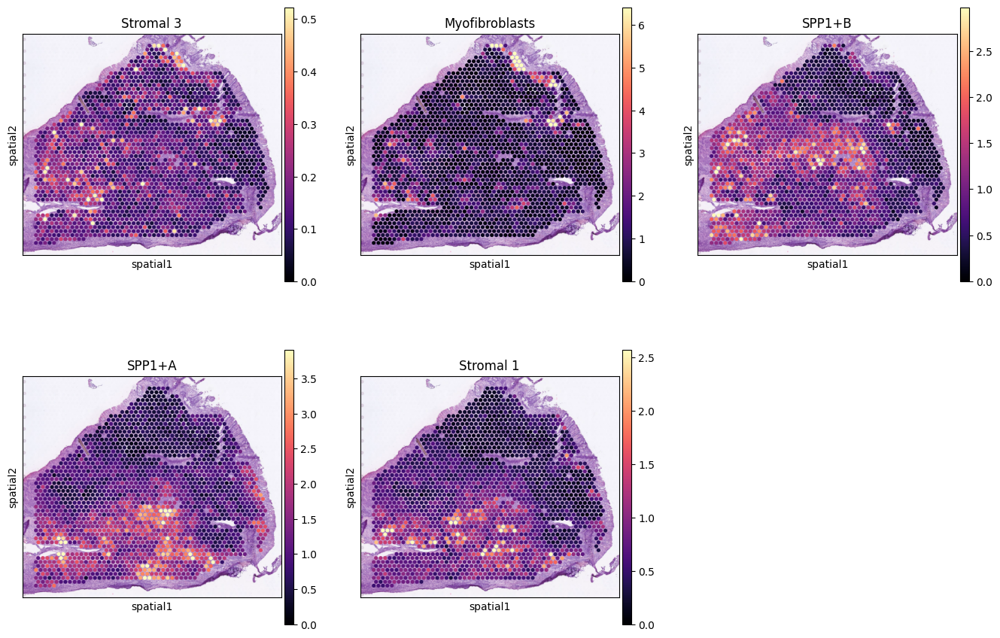

In [ ]:
# FOR A SAMPLE WITH LYMPH NODE POS + LIVER MET NEG

# add 95% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q95_cell_abundance_w_sf']

# select one slide
from cell2location.utils import select_slide
slide = select_slide(adata_vis, 'SN048_A416371_Rep2')

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(slide, cmap='magma',
                  # from above
                  color=['Stromal 3', 'Myofibroblasts', 'SPP1+B',
                         'SPP1+A', 'Stromal 1'],
                  ncols=3, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2'
                 )

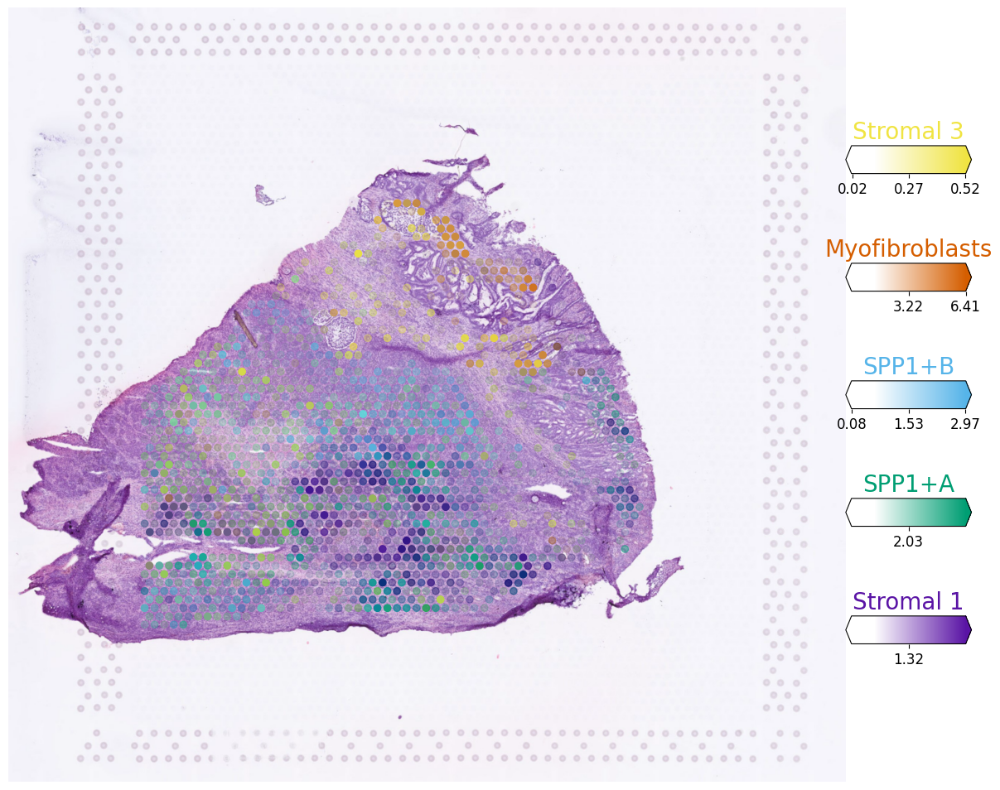

In [ ]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['Stromal 3', 'Myofibroblasts', 'SPP1+B',
                'SPP1+A', 'Stromal 1']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_vis, 'SN048_A416371_Rep2')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )


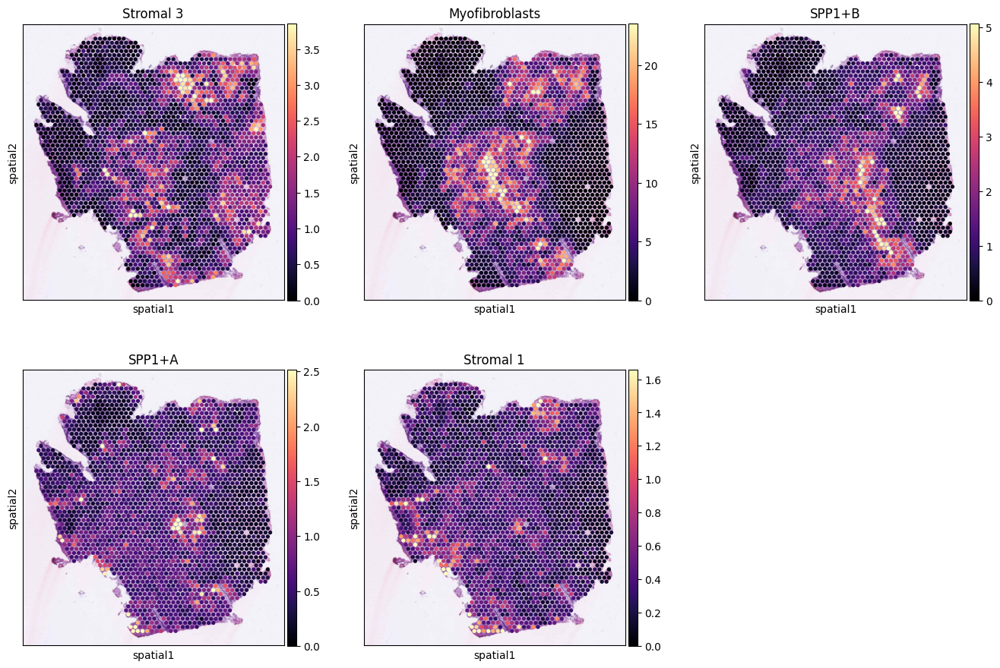

In [ ]:
# FOR A SAMPLE WITH LYMPH NODE NEG + LIVER MET NEG

# add 95% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q95_cell_abundance_w_sf']

# select one slide
from cell2location.utils import select_slide
slide = select_slide(adata_vis, 'SN123_A938797_Rep1')

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(slide, cmap='magma',
                  # from above
                  color=['Stromal 3', 'Myofibroblasts', 'SPP1+B',
                         'SPP1+A', 'Stromal 1'],
                  ncols=3, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2'
                 )

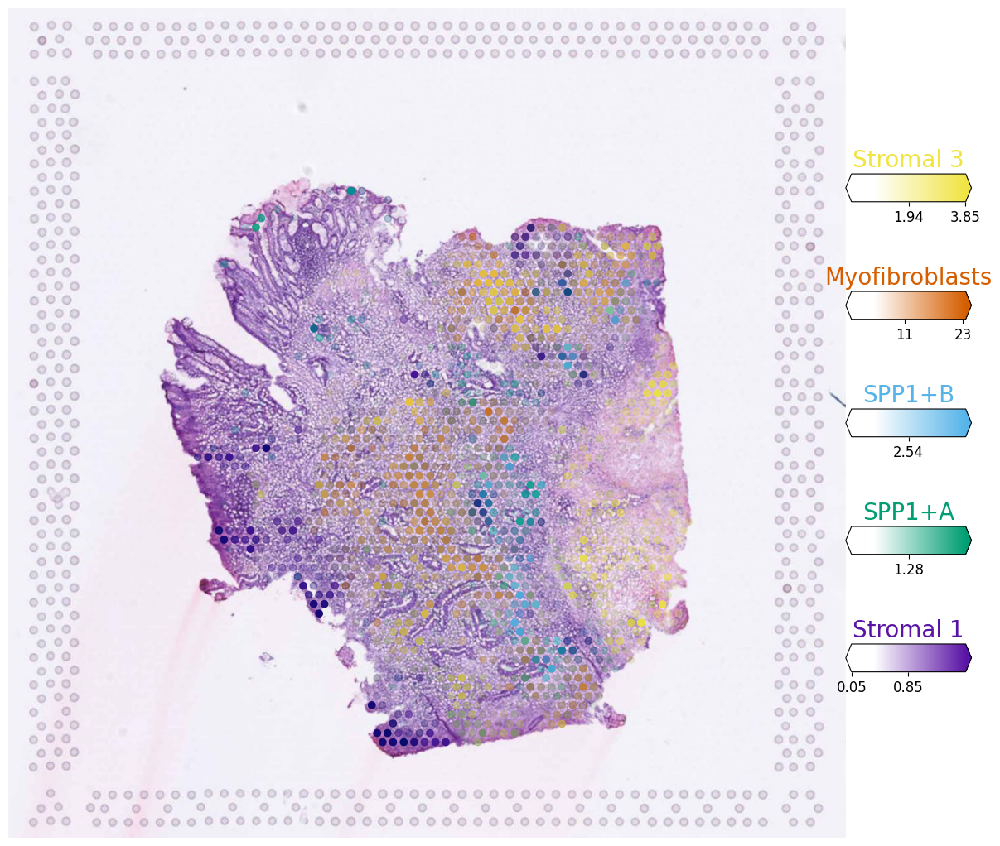

In [ ]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['Stromal 3', 'Myofibroblasts', 'SPP1+B',
                'SPP1+A', 'Stromal 1']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_vis, 'SN123_A938797_Rep1')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )


No liver metastasis cellular compartments/tissue zones

In [11]:
from cell2location import run_colocation
liver_neg_res_dict, adata_liver_neg = run_colocation(
    adata_liver_neg,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/liver_met_none/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_5462locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_5462locations_40factors


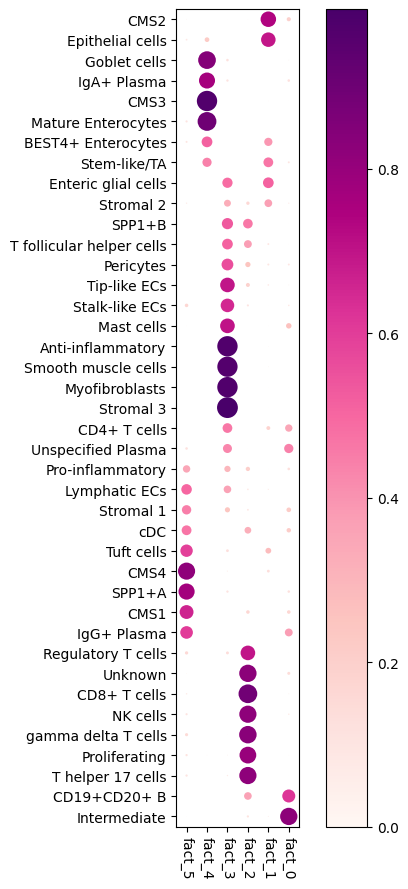

In [12]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
liver_neg_res_dict['n_fact6']['mod'].plot_cell_type_loadings()

In [ ]:
# Other analyses from the Cell2Loc Tutorial

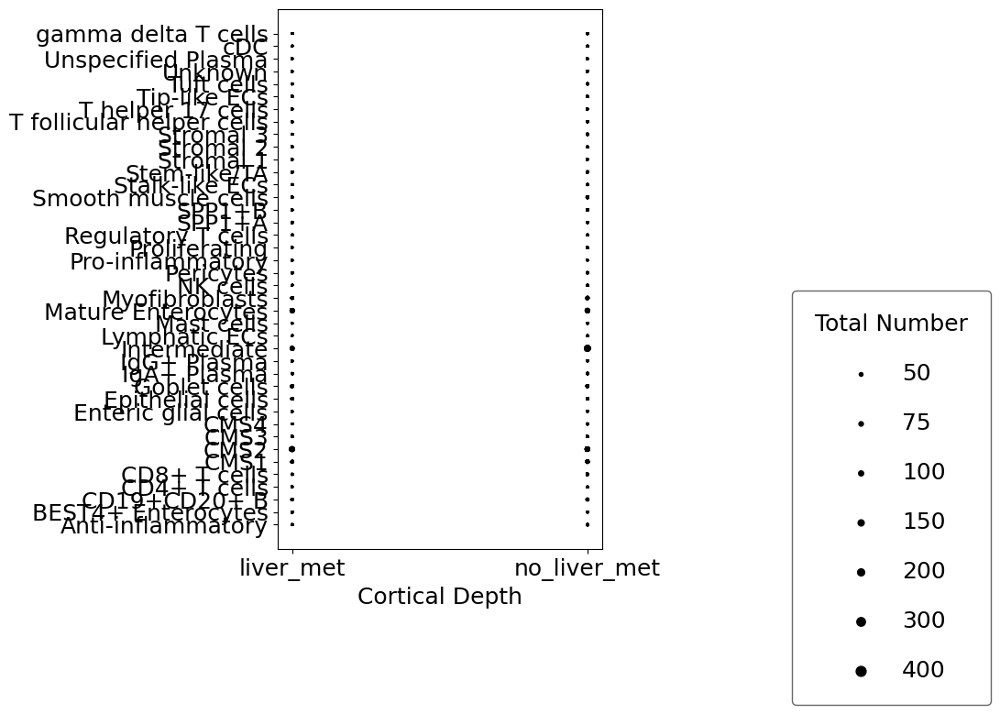

In [ ]:
def is_met_string(sample_name):
    if sample_name in liver_met_samples:
        return 'liver_met'
    else:
        return 'no_liver_met'

adata_vis.obs['liver_metastasis_string'] = adata_vis.obs['sample'].apply(is_met_string)

cell2location.plt.plot_absolute_abundances_1D(adata_vis, dimName='liver_metastasis_string', pws=[10, 50, 75, 100, 150, 200, 300, 400])

In [ ]:
cell2location.plt.plot_density_1D(adata_vis, dimName='liver_metastasis_string', areaName='mt_frac')

# Differential Expression

First, I need to add lymph_node_metastasis and liver_metastais columns

In [ ]:
lymph_node_met_samples = ['SN048_A121573_Rep1', 'SN048_A121573_Rep2',
                          'SN048_A416371_Rep1', 'SN048_A416371_Rep2',
                          'SN84_A120838_Rep1', 'SN84_A120838_Rep2',
                          'SN123_A551763_Rep1', 'SN123_A595688_Rep1',
                          'SN124_A595688_Rep2']

def is_node_pos(sample_name):
    # Check if the sample_name is in the list of lymph_node_met_samples
    if sample_name in lymph_node_met_samples:
        return 1
    else:
        return 0

In [ ]:
adata_vis.obs['lymph_node_metastasis'] = adata_vis.obs['sample'].apply(is_node_pos)

In [ ]:
liver_met_samples = ['SN048_A121573_Rep1', 'SN048_A121573_Rep2',
                     'SN123_A551763_Rep1', 'SN123_A595688_Rep1',
                     'SN124_A595688_Rep2']

def is_liver_met(sample_name):
    # Check if the sample_name is in the list of lymph_node_met_samples
    if sample_name in liver_met_samples:
        return 1
    else:
        return 0

In [ ]:
adata_vis.obs['liver_metastasis'] = adata_vis.obs['sample'].apply(is_liver_met)

In [ ]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,_indices,_scvi_batch,_scvi_labels,lymph_node_metastasis,liver_metastasis
spot_id,,,,,,,,,,,,,,,,,,
SN048_A121573_Rep1_AAACAAGTATCTCCCA-1,1,50,102,SN048_A121573_Rep1,5341,8.583355,17364.0,9.762212,25.662290,33.920756,43.221608,54.947017,0.028680,0,0,0,1,1
SN048_A121573_Rep1_AAACACCAATAACTGC-1,1,59,19,SN048_A121573_Rep1,5674,8.643826,22320.0,10.013283,28.369176,38.342294,47.974910,59.605735,0.083378,1,0,0,1,1
SN048_A121573_Rep1_AAACATTTCCCGGATT-1,1,61,97,SN048_A121573_Rep1,3170,8.061802,7669.0,8.945072,24.149172,33.224671,43.160777,57.034815,0.060112,2,0,0,1,1
SN048_A121573_Rep1_AAACCCGAACGAAATC-1,1,45,115,SN048_A121573_Rep1,6756,8.818334,27100.0,10.207326,19.712177,27.811808,36.878229,49.793358,0.033727,3,0,0,1,1
SN048_A121573_Rep1_AAACCGGGTAGGTACC-1,1,42,28,SN048_A121573_Rep1,4295,8.365440,12265.0,9.414586,23.742356,32.768039,41.956788,54.969425,0.077782,4,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN124_A938797_Rep2_TTGTGGCCCTGACAGT-1,1,18,60,SN124_A938797_Rep2,5932,8.688285,21543.0,9.977853,23.761779,32.530288,42.552105,55.331198,0.021353,19438,12,0,0,0
SN124_A938797_Rep2_TTGTTAGCAAATTCGA-1,1,22,42,SN124_A938797_Rep2,6011,8.701513,22686.0,10.029548,23.239002,31.138147,41.369126,55.108878,0.014502,19439,12,0,0,0
SN124_A938797_Rep2_TTGTTCAGTGTGCTAC-1,1,24,64,SN124_A938797_Rep2,5444,8.602453,17600.0,9.775711,22.823864,31.090909,40.971591,53.619318,0.013636,19440,12,0,0,0


Subset adata_vis into met vs no-met for both lymph node metastasis and liver metastasis.

In [ ]:
# LN mets
adata_LN_met = adata_vis[adata_vis.obs['lymph_node_metastasis'] == 1].copy()
adata_LN_neg = adata_vis[adata_vis.obs['lymph_node_metastasis'] == 0].copy()

# Liver mets
adata_liver_met = adata_vis[adata_vis.obs['liver_metastasis'] == 1].copy()
adata_liver_neg = adata_vis[adata_vis.obs['liver_metastasis'] == 0].copy()

In [ ]:
adata_LN_met.obs.shape

(12308, 18)

In [ ]:
adata_liver_met.obs.shape

(6846, 18)

Finding marker genes for lymph node mets

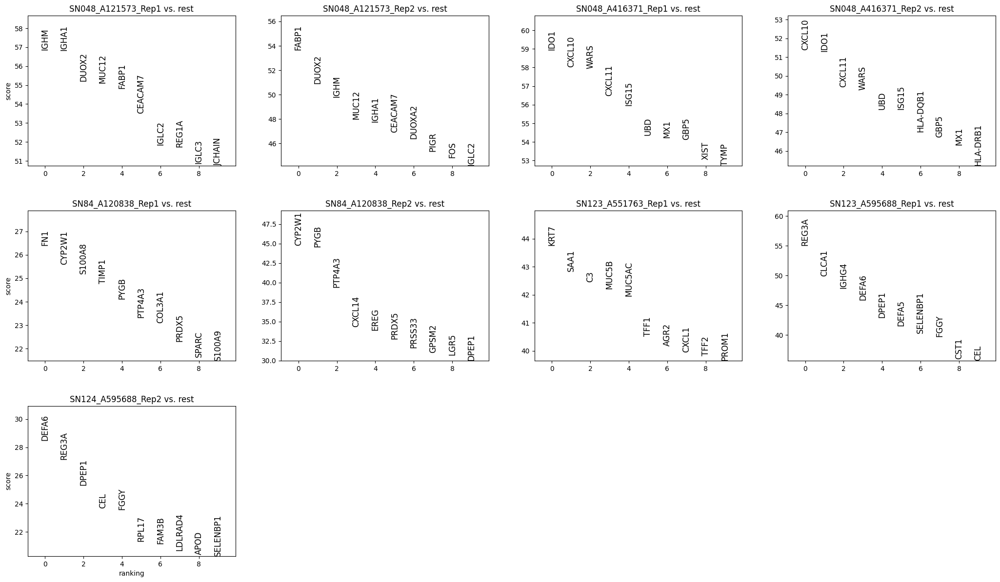

,SN048_A121573_Rep1,SN048_A121573_Rep2,SN048_A416371_Rep1,SN048_A416371_Rep2,SN84_A120838_Rep1,SN84_A120838_Rep2,SN123_A551763_Rep1,SN123_A595688_Rep1,SN124_A595688_Rep2
0,IGHM,FABP1,IDO1,CXCL10,FN1,CYP2W1,KRT7,REG3A,DEFA6
1,IGHA1,DUOX2,CXCL10,IDO1,CYP2W1,PYGB,SAA1,CLCA1,REG3A
2,DUOX2,IGHM,WARS,CXCL11,S100A8,PTP4A3,C3,IGHG4,DPEP1
3,MUC12,MUC12,CXCL11,WARS,TIMP1,CXCL14,MUC5B,DEFA6,CEL
4,FABP1,IGHA1,ISG15,UBD,PYGB,EREG,MUC5AC,DPEP1,FGGY


In [ ]:
sc.tl.rank_genes_groups(adata_LN_met, groupby='sample', method='wilcoxon',
                       n_genes=25, use_raw=False, layers='log1p_n_genes_by_counts')

sc.pl.rank_genes_groups(adata_LN_met, n_genes=10, sharey=False,
                        fontsize=12, use_raw=False)

pd.DataFrame(adata_LN_met.uns['rank_genes_groups']['names']).head(5)

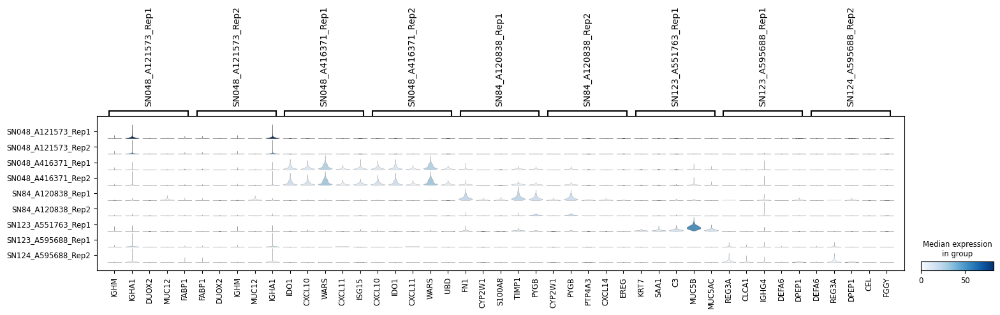

In [ ]:
sc.pl.rank_genes_groups_stacked_violin(adata_LN_met,
                              n_genes=5, dendrogram=False, use_raw=False)

Finding marker genes for liver mets

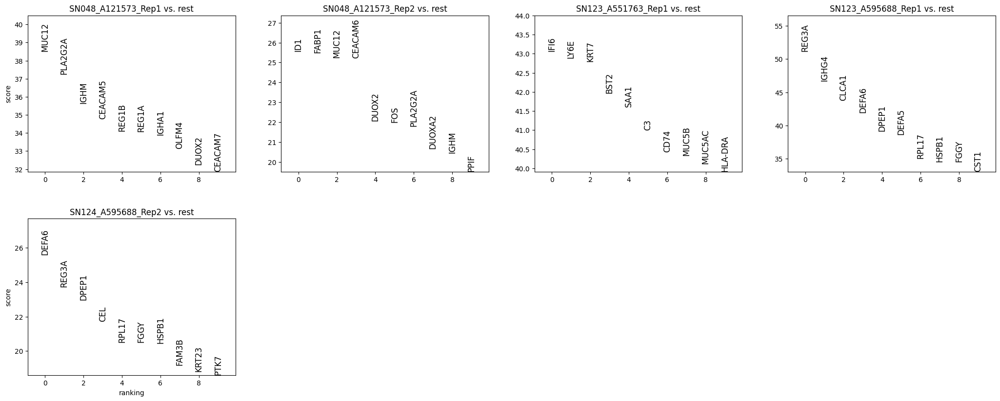

,SN048_A121573_Rep1,SN048_A121573_Rep2,SN123_A551763_Rep1,SN123_A595688_Rep1,SN124_A595688_Rep2
0,MUC12,ID1,IFI6,REG3A,DEFA6
1,PLA2G2A,FABP1,LY6E,IGHG4,REG3A
2,IGHM,MUC12,KRT7,CLCA1,DPEP1
3,CEACAM5,CEACAM6,BST2,DEFA6,CEL
4,REG1B,DUOX2,SAA1,DPEP1,RPL17


In [ ]:
sc.tl.rank_genes_groups(adata_liver_met, groupby='sample', method='wilcoxon',
                       n_genes=25, use_raw=False, layers='log1p_n_genes_by_counts')

sc.pl.rank_genes_groups(adata_liver_met, n_genes=10, sharey=False,
                        fontsize=12)

pd.DataFrame(adata_liver_met.uns['rank_genes_groups']['names']).head(5)

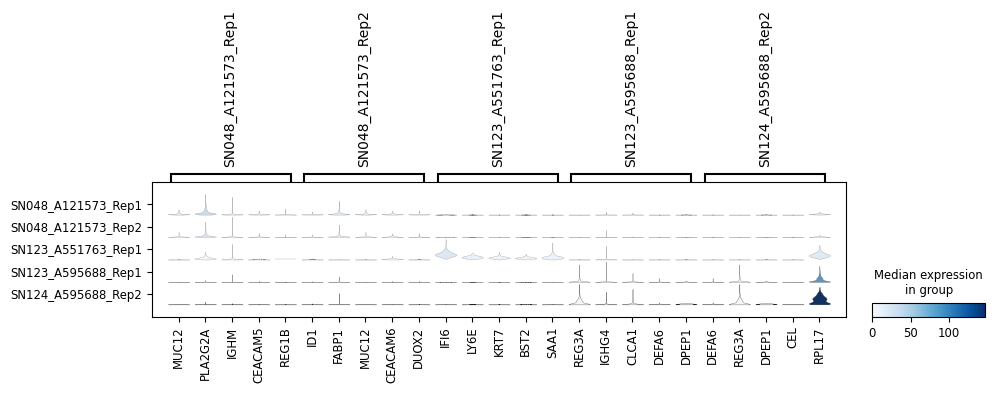

In [ ]:
sc.pl.rank_genes_groups_stacked_violin(adata_liver_met,
                              n_genes=5, dendrogram=False, use_raw=False)

In [ ]:
def is_met_string(sample_name):
    if sample_name in lymph_node_met_samples:
        return 'lymph_node_met'
    else:
        return 'no_lymph_node_met'

adata_vis.obs['lymph_node_metastasis_string'] = adata_vis.obs['sample'].apply(is_met_string)

def is_met_string(sample_name):
    if sample_name in liver_met_samples:
        return 'liver_met'
    else:
        return 'no_liver_met'

adata_vis.obs['liver_metastasis_string'] = adata_vis.obs['sample'].apply(is_met_string)

adata_vis.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,_indices,_scvi_batch,_scvi_labels,lymph_node_metastasis,liver_metastasis,lymph_node_metastasis_string,liver_metastasis_string
spot_id,,,,,,,,,,,,,,,,,,,,
SN048_A121573_Rep1_AAACAAGTATCTCCCA-1,1,50,102,SN048_A121573_Rep1,5341,8.583355,17364.0,9.762212,25.662290,33.920756,43.221608,54.947017,0.028680,0,0,0,1,1,lymph_node_met,liver_met
SN048_A121573_Rep1_AAACACCAATAACTGC-1,1,59,19,SN048_A121573_Rep1,5674,8.643826,22320.0,10.013283,28.369176,38.342294,47.974910,59.605735,0.083378,1,0,0,1,1,lymph_node_met,liver_met
SN048_A121573_Rep1_AAACATTTCCCGGATT-1,1,61,97,SN048_A121573_Rep1,3170,8.061802,7669.0,8.945072,24.149172,33.224671,43.160777,57.034815,0.060112,2,0,0,1,1,lymph_node_met,liver_met
SN048_A121573_Rep1_AAACCCGAACGAAATC-1,1,45,115,SN048_A121573_Rep1,6756,8.818334,27100.0,10.207326,19.712177,27.811808,36.878229,49.793358,0.033727,3,0,0,1,1,lymph_node_met,liver_met
SN048_A121573_Rep1_AAACCGGGTAGGTACC-1,1,42,28,SN048_A121573_Rep1,4295,8.365440,12265.0,9.414586,23.742356,32.768039,41.956788,54.969425,0.077782,4,0,0,1,1,lymph_node_met,liver_met
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN124_A938797_Rep2_TTGTGGCCCTGACAGT-1,1,18,60,SN124_A938797_Rep2,5932,8.688285,21543.0,9.977853,23.761779,32.530288,42.552105,55.331198,0.021353,19438,12,0,0,0,no_lymph_node_met,no_liver_met
SN124_A938797_Rep2_TTGTTAGCAAATTCGA-1,1,22,42,SN124_A938797_Rep2,6011,8.701513,22686.0,10.029548,23.239002,31.138147,41.369126,55.108878,0.014502,19439,12,0,0,0,no_lymph_node_met,no_liver_met
SN124_A938797_Rep2_TTGTTCAGTGTGCTAC-1,1,24,64,SN124_A938797_Rep2,5444,8.602453,17600.0,9.775711,22.823864,31.090909,40.971591,53.619318,0.013636,19440,12,0,0,0,no_lymph_node_met,no_liver_met


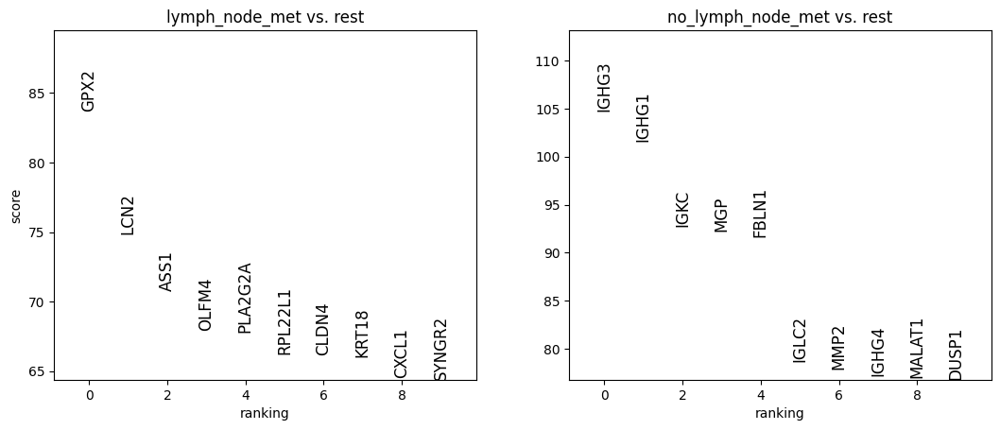

,lymph_node_met,no_lymph_node_met
0,GPX2,IGHG3
1,LCN2,IGHG1
2,ASS1,IGKC
3,OLFM4,MGP
4,PLA2G2A,FBLN1


In [ ]:
sc.tl.rank_genes_groups(adata_vis, groupby='lymph_node_metastasis_string', method='wilcoxon',
                       n_genes=25, use_raw=False, layers='log1p_n_genes_by_counts')

sc.pl.rank_genes_groups(adata_vis, n_genes=10, sharey=False,
                        fontsize=12)

pd.DataFrame(adata_vis.uns['rank_genes_groups']['names']).head(5)

In [ ]:
lymph_node_met_df = pd.DataFrame(adata_vis.uns['rank_genes_groups']['names'])
lymph_node_met_df.to_csv('/content/drive/MyDrive/STEMREM205_Group_Project/Cell2Loc/ranked_genes/lymph_node_metastasis_ranked_genes.csv')

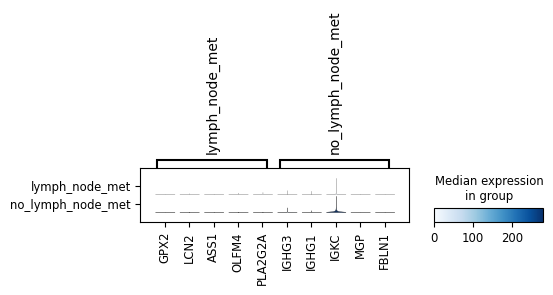

In [ ]:
sc.pl.rank_genes_groups_stacked_violin(adata_vis,
                              n_genes=5, dendrogram=False, use_raw=False)

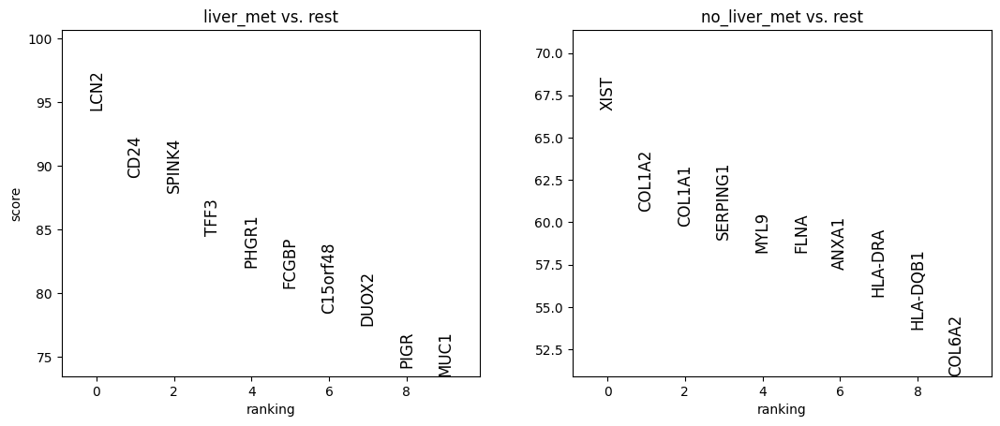

,liver_met,no_liver_met
0,LCN2,XIST
1,CD24,COL1A2
2,SPINK4,COL1A1
3,TFF3,SERPING1
4,PHGR1,MYL9


In [ ]:
sc.tl.rank_genes_groups(adata_vis, groupby='liver_metastasis_string', method='wilcoxon',
                       n_genes=25, use_raw=False, layers='log1p_n_genes_by_counts')

sc.pl.rank_genes_groups(adata_vis, n_genes=10, sharey=False,
                        fontsize=12, use_raw=False)

pd.DataFrame(adata_vis.uns['rank_genes_groups']['names']).head(5)

In [ ]:
liver_met_df = pd.DataFrame(adata_vis.uns['rank_genes_groups']['names'])
liver_met_df.to_csv('/content/drive/MyDrive/STEMREM205_Group_Project/Cell2Loc/ranked_genes/liver_metastasis_ranked_genes.csv')

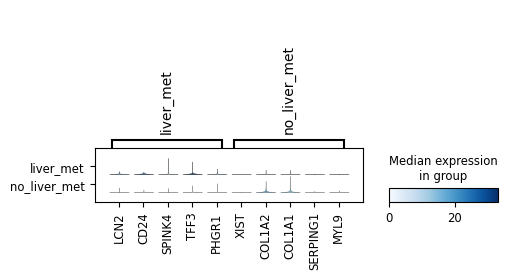

In [ ]:
sc.pl.rank_genes_groups_stacked_violin(adata_vis,
                              n_genes=5, dendrogram=False, use_raw=False)

In [ ]:
# FOR A SAMPLE WITH LYMPH NODE POS + LIVER MET POS

#from cell2location.utils import select_slide
#slide = select_slide(adata_vis, 'SN048_A121573_Rep2')
#with mpl.rc_context({'figure.figsize': [6,7],
#                     'axes.facecolor': 'black'}):
#    sc.pl.spatial(slide,
#                  color=['CD24', "LCN2", 'SPINK4', 'TFF3', 'PHGR1'],
#                  img_key=None, size=1,
#                  vmin=0, cmap='magma', vmax='p99.0',
#                  gene_symbols='SYMBOL'
#                 )

In [ ]:
test = np.array(adata_vis.var_names)
('LCN2' in test)

True

In [ ]:
celltype_fraction_df = pd.read_csv('/content/drive/MyDrive/STEMREM205_Group_Project/Cell2Loc/results_belgian_cohort/cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_19443locations_40factors/cell_type_fractions_mean/n_fact12.csv')
celltype_fraction_df = celltype_fraction_df.set_index(celltype_fraction_df.iloc[:,0])
celltype_fraction_df.drop('Unnamed: 0', axis=1, inplace=True)
celltype_fraction_df.head(10)

,mean_cell_type_factorsfact_0,mean_cell_type_factorsfact_1,mean_cell_type_factorsfact_2,mean_cell_type_factorsfact_3,mean_cell_type_factorsfact_4,mean_cell_type_factorsfact_5,mean_cell_type_factorsfact_6,mean_cell_type_factorsfact_7,mean_cell_type_factorsfact_8,mean_cell_type_factorsfact_9,mean_cell_type_factorsfact_10,mean_cell_type_factorsfact_11
Unnamed: 0,,,,,,,,,,,,
Anti-inflammatory,0.000000,0.000000,0.276662,0.000000,0.000000,0.000000,0.021635,0.000000,0.002741,0.009079,0.428727,0.261155
BEST4+ Enterocytes,0.000000,0.000000,0.000000,0.000000,0.323343,0.393494,0.063020,0.133583,0.086559,0.000000,0.000000,0.000000
CD19+CD20+ B,0.026507,0.911950,0.000000,0.000000,0.026991,0.000000,0.000000,0.000000,0.015336,0.000000,0.000000,0.019217
CD4+ T cells,0.112378,0.099274,0.537637,0.000000,0.036343,0.000000,0.000000,0.000000,0.172265,0.000000,0.000000,0.042103
CD8+ T cells,0.075511,0.845240,0.000000,0.077617,0.000000,0.000000,0.001632,0.000000,0.000000,0.000000,0.000000,0.000000
CMS1,0.143398,0.038283,0.000000,0.818319,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CMS2,0.150113,0.000000,0.008098,0.009220,0.000000,0.008005,0.000185,0.000000,0.824379,0.000000,0.000000,0.000000
CMS3,0.000509,0.000000,0.000000,0.000000,0.508587,0.255521,0.235384,0.000000,0.000000,0.000000,0.000000,0.000000
CMS4,0.000000,0.177948,0.059196,0.505699,0.000000,0.000000,0.000916,0.000000,0.092266,0.000000,0.069696,0.094279


In [ ]:
celltype_fraction_df.max(axis=1, numeric_only=True).sort_values(ascending=False)

Unnamed: 0
Myofibroblasts               0.986412
Mature Enterocytes           0.976010
Smooth muscle cells          0.925250
Pericytes                    0.914292
CD19+CD20+ B                 0.911950
Goblet cells                 0.889456
IgA+ Plasma                  0.860079
Intermediate                 0.845485
CD8+ T cells                 0.845240
gamma delta T cells          0.834068
CMS2                         0.824379
CMS1                         0.818319
Tip-like ECs                 0.770622
NK cells                     0.769847
T helper 17 cells            0.730676
Proliferating                0.719046
Stem-like/TA                 0.710339
Regulatory T cells           0.669057
Unknown                      0.658046
Stromal 1                    0.649008
Epithelial cells             0.611672
Stromal 2                    0.602931
CD4+ T cells                 0.537637
Stromal 3                    0.521553
SPP1+B                       0.516651
CMS3                         0.508587
C

In [ ]:
def plot_genes_per_cell_type(slide, genes, ctypes):
    n_genes = len(genes)
    n_ctypes = len(ctypes)
    fig, axs = plt.subplots(
        nrows=n_genes, ncols=n_ctypes + 1, figsize=(4.5 * (n_ctypes + 1) + 2, 5 * n_genes + 1), squeeze=False
    )
    # axs = axs.reshape((n_genes, n_ctypes+1))

    # plots of every gene
    for j in range(n_genes):
        # limit color scale at 99.2% quantile of gene expression (computed across cell types)
        quantile_across_ct = np.array(
            [
                np.quantile(slide.layers[n][:, slide.var["SYMBOL"] == genes[j]].toarray(), 0.992)
                for n in slide.uns["mod"]["factor_names"]
            ]
        )
        quantile_across_ct = np.partition(quantile_across_ct.flatten(), -2)[-2]
        sc.pl.spatial(
            slide,
            cmap="magma",
            color=genes[j],
            layer=ctypes[i],
            gene_symbols=slide.var["SYMBOL"],
            ncols=4,
            size=1.3,
            img_key="hires",
            # limit color scale at 99.2% quantile of gene expression
            vmin=0,
            vmax="p99.2",
            ax=axs[j, 0],
            show=False,
        )

        # plots of every cell type
        for i in range(n_ctypes):
            sc.pl.spatial(
                slide,
                cmap="magma",
                color=genes[j],
                layer=ctypes[i],
                gene_symbols=slide.var["SYMBOL"],
                ncols=4,
                size=1.3,
                img_key="hires",
                # limit color scale at 99.2% quantile of gene expression
                vmin=0,
                vmax=quantile_across_ct,
                ax=axs[j, i + 1],
                show=False,
            )
            axs[j, i + 1].set_title(f"{genes[j]} {ctypes[i]}")

    return fig, axs

In [ ]:
# Compute expected expression per cell type
#expected_dict = mod.module.model.compute_expected_per_cell_type(
#    adata_vis.uns['mod']['post_sample_q05'], mod.adata_manager
#)

# Add to anndata layers
#for i, n in enumerate(mod.factor_names_):
#    adata_vis.layers[n] = expected_dict['mu'][i]

# Save anndata object with results
#adata_file = f"{run_name}/sp.h5ad"
#adata_vis.write(adata_file)
#adata_file

'/content/drive/MyDrive/STEMREM205_Group_Project/Cell2Loc/results_belgian_cohort/cell2location_map/sp.h5ad'

In [ ]:
adata_vis.uns['mod']['factor_names']

array(['Anti-inflammatory', 'BEST4+ Enterocytes', 'CD19+CD20+ B',
       'CD4+ T cells', 'CD8+ T cells', 'CMS1', 'CMS2', 'CMS3', 'CMS4',
       'Enteric glial cells', 'Epithelial cells', 'Goblet cells',
       'IgA+ Plasma', 'IgG+ Plasma', 'Intermediate', 'Lymphatic ECs',
       'Mast cells', 'Mature Enterocytes', 'Myofibroblasts', 'NK cells',
       'Pericytes', 'Pro-inflammatory', 'Proliferating',
       'Regulatory T cells', 'SPP1+A', 'SPP1+B', 'Smooth muscle cells',
       'Stalk-like ECs', 'Stem-like/TA', 'Stromal 1', 'Stromal 2',
       'Stromal 3', 'T follicular helper cells', 'T helper 17 cells',
       'Tip-like ECs', 'Tuft cells', 'Unknown', 'Unspecified Plasma',
       'cDC', 'gamma delta T cells'], dtype=object)

In [ ]:
# list cell types and genes for plotting
#ctypes = ['Anti-inflammatory','Myofibroblasts', 'Mature Enterocytes', 'Smooth muscle cells']
#genes = ['GPX2', 'LCN2', 'ASS1', 'OLFM4', 'PLA2G2A']

#with mpl.rc_context({'axes.facecolor':  'black'}):
    # select one slide
#    slide = select_slide(adata_vis, 'SN048_A416371_Rep2')

    #from tutorial_utils import plot_genes_per_cell_type
#    plot_genes_per_cell_type(slide, genes, ctypes);

## Pathology Annotated Analysis

In [13]:
sp_annot_file = '/content/drive/MyDrive/STEMREM205_Group_Project/sp_with_pathology_ann.h5ad'

adata_annot = sc.read_h5ad(sp_annot_file)

In [ ]:
run_name

'/content/drive/MyDrive/STEMREM205_Group_Project/Cell2Loc/results_belgian_cohort/cell2location_map'

In [ ]:
adata_annot

AnnData object with n_obs × n_vars = 19443 × 12697
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', '_indices', '_scvi_batch', '_scvi_labels', 'Pathologist_Annotations'
    var: 'feature_types', 'genome', 'mt', 'n_cells_by_counts-SN048_A121573_Rep1', 'mean_counts-SN048_A121573_Rep1', 'log1p_mean_counts-SN048_A121573_Rep1', 'pct_dropout_by_counts-SN048_A121573_Rep1', 'total_counts-SN048_A121573_Rep1', 'log1p_total_counts-SN048_A121573_Rep1', 'n_cells_by_counts-SN048_A121573_Rep2', 'mean_counts-SN048_A121573_Rep2', 'log1p_mean_counts-SN048_A121573_Rep2', 'pct_dropout_by_counts-SN048_A121573_Rep2', 'total_counts-SN048_A121573_Rep2', 'log1p_total_counts-SN048_A121573_Rep2', 'n_cells_by_counts-SN048_A416371_Rep1', 'mean_counts-SN048_A416371_Rep1', 'log1p_mean_counts

In [14]:
def transform_annotation(annotation):
    if not isinstance(annotation, str):
        return "NA"

    if annotation == "tumor":
        return "tumor"
    elif "tumor" in annotation and "stroma" in annotation:
        return "tumor&stroma"
    elif "exclude" in annotation:
        return "NA"
    else:
        return "other"

adata_annot.obs["region"] = adata_annot.obs["Pathologist_Annotations"].apply(transform_annotation)

In [ ]:
adata_annot.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,_indices,_scvi_batch,_scvi_labels,Pathologist_Annotations,region
spot_id,,,,,,,,,,,,,,,,,,
SN048_A121573_Rep1_AAACAAGTATCTCCCA-1,1,50,102,SN048_A121573_Rep1,5341,8.583355,17364.0,9.762212,25.662290,33.920756,43.221608,54.947017,0.028680,0,0,0,epithelium&submucosa,other
SN048_A121573_Rep1_AAACACCAATAACTGC-1,1,59,19,SN048_A121573_Rep1,5674,8.643826,22320.0,10.013283,28.369176,38.342294,47.974910,59.605735,0.083378,1,0,0,exclude,NA
SN048_A121573_Rep1_AAACATTTCCCGGATT-1,1,61,97,SN048_A121573_Rep1,3170,8.061802,7669.0,8.945072,24.149172,33.224671,43.160777,57.034815,0.060112,2,0,0,submucosa,other
SN048_A121573_Rep1_AAACCCGAACGAAATC-1,1,45,115,SN048_A121573_Rep1,6756,8.818334,27100.0,10.207326,19.712177,27.811808,36.878229,49.793358,0.033727,3,0,0,tumor,tumor
SN048_A121573_Rep1_AAACCGGGTAGGTACC-1,1,42,28,SN048_A121573_Rep1,4295,8.365440,12265.0,9.414586,23.742356,32.768039,41.956788,54.969425,0.077782,4,0,0,tumor,tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN124_A938797_Rep2_TTGTGGCCCTGACAGT-1,1,18,60,SN124_A938797_Rep2,5932,8.688285,21543.0,9.977853,23.761779,32.530288,42.552105,55.331198,0.021353,19438,12,0,stroma_fibroblastic_IC med,other
SN124_A938797_Rep2_TTGTTAGCAAATTCGA-1,1,22,42,SN124_A938797_Rep2,6011,8.701513,22686.0,10.029548,23.239002,31.138147,41.369126,55.108878,0.014502,19439,12,0,stroma_fibroblastic_IC med,other
SN124_A938797_Rep2_TTGTTCAGTGTGCTAC-1,1,24,64,SN124_A938797_Rep2,5444,8.602453,17600.0,9.775711,22.823864,31.090909,40.971591,53.619318,0.013636,19440,12,0,stroma_fibroblastic_IC high,other


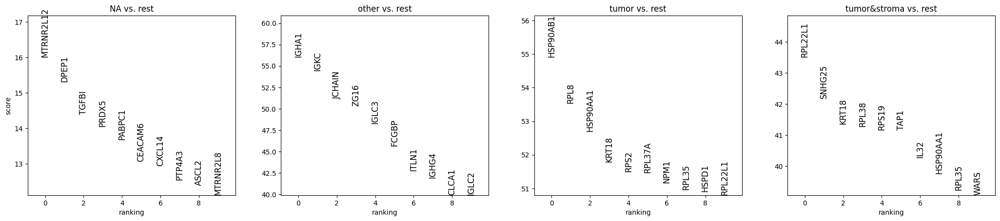

,NA,other,tumor,tumor&stroma
0,MTRNR2L12,IGHA1,HSP90AB1,RPL22L1
1,DPEP1,IGKC,RPL8,SNHG25
2,TGFBI,JCHAIN,HSP90AA1,KRT18
3,PRDX5,ZG16,KRT18,RPL38
4,PABPC1,IGLC3,RPS2,RPS19


In [ ]:
sc.tl.rank_genes_groups(adata_annot, groupby='region', method='wilcoxon',
                       n_genes=25, use_raw=False, layers='log1p_n_genes_by_counts')

sc.pl.rank_genes_groups(adata_annot, n_genes=10, sharey=False,
                        fontsize=12)

pd.DataFrame(adata_annot.uns['rank_genes_groups']['names']).head(5)

In [15]:
lymph_node_met_samples = ['SN048_A121573_Rep1', 'SN048_A121573_Rep2',
                          'SN048_A416371_Rep1', 'SN048_A416371_Rep2',
                          'SN84_A120838_Rep1', 'SN84_A120838_Rep2',
                          'SN123_A551763_Rep1', 'SN123_A595688_Rep1',
                          'SN124_A595688_Rep2']

def is_node_pos(sample_name):
    # Check if the sample_name is in the list of lymph_node_met_samples
    if sample_name in lymph_node_met_samples:
        return 1
    else:
        return 0

adata_annot.obs['lymph_node_metastasis'] = adata_annot.obs['sample'].apply(is_node_pos)

In [16]:
liver_met_samples = ['SN048_A121573_Rep1', 'SN048_A121573_Rep2',
                     'SN123_A551763_Rep1', 'SN123_A595688_Rep1',
                     'SN124_A595688_Rep2']

def is_liver_met(sample_name):
    # Check if the sample_name is in the list of lymph_node_met_samples
    if sample_name in liver_met_samples:
        return 1
    else:
        return 0

adata_annot.obs['liver_metastasis'] = adata_annot.obs['sample'].apply(is_liver_met)

In [ ]:
adata_annot.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,_indices,_scvi_batch,_scvi_labels,Pathologist_Annotations,region,lymph_node_metastasis,liver_metastasis
spot_id,,,,,,,,,,,,,,,,,,,,
SN048_A121573_Rep1_AAACAAGTATCTCCCA-1,1,50,102,SN048_A121573_Rep1,5341,8.583355,17364.0,9.762212,25.662290,33.920756,43.221608,54.947017,0.028680,0,0,0,epithelium&submucosa,other,1,1
SN048_A121573_Rep1_AAACACCAATAACTGC-1,1,59,19,SN048_A121573_Rep1,5674,8.643826,22320.0,10.013283,28.369176,38.342294,47.974910,59.605735,0.083378,1,0,0,exclude,NA,1,1
SN048_A121573_Rep1_AAACATTTCCCGGATT-1,1,61,97,SN048_A121573_Rep1,3170,8.061802,7669.0,8.945072,24.149172,33.224671,43.160777,57.034815,0.060112,2,0,0,submucosa,other,1,1
SN048_A121573_Rep1_AAACCCGAACGAAATC-1,1,45,115,SN048_A121573_Rep1,6756,8.818334,27100.0,10.207326,19.712177,27.811808,36.878229,49.793358,0.033727,3,0,0,tumor,tumor,1,1
SN048_A121573_Rep1_AAACCGGGTAGGTACC-1,1,42,28,SN048_A121573_Rep1,4295,8.365440,12265.0,9.414586,23.742356,32.768039,41.956788,54.969425,0.077782,4,0,0,tumor,tumor,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SN124_A938797_Rep2_TTGTGGCCCTGACAGT-1,1,18,60,SN124_A938797_Rep2,5932,8.688285,21543.0,9.977853,23.761779,32.530288,42.552105,55.331198,0.021353,19438,12,0,stroma_fibroblastic_IC med,other,0,0
SN124_A938797_Rep2_TTGTTAGCAAATTCGA-1,1,22,42,SN124_A938797_Rep2,6011,8.701513,22686.0,10.029548,23.239002,31.138147,41.369126,55.108878,0.014502,19439,12,0,stroma_fibroblastic_IC med,other,0,0
SN124_A938797_Rep2_TTGTTCAGTGTGCTAC-1,1,24,64,SN124_A938797_Rep2,5444,8.602453,17600.0,9.775711,22.823864,31.090909,40.971591,53.619318,0.013636,19440,12,0,stroma_fibroblastic_IC high,other,0,0


In [17]:
# LN mets
adata_LN_met = adata_annot[adata_annot.obs['lymph_node_metastasis'] == 1].copy()
adata_LN_neg = adata_annot[adata_annot.obs['lymph_node_metastasis'] == 0].copy()

# Liver mets
adata_liver_met = adata_annot[adata_annot.obs['liver_metastasis'] == 1].copy()
adata_liver_neg = adata_annot[(adata_vis.obs['liver_metastasis'] == 0) & (adata_vis.obs['lymph_node_metastasis'] == 1)].copy()

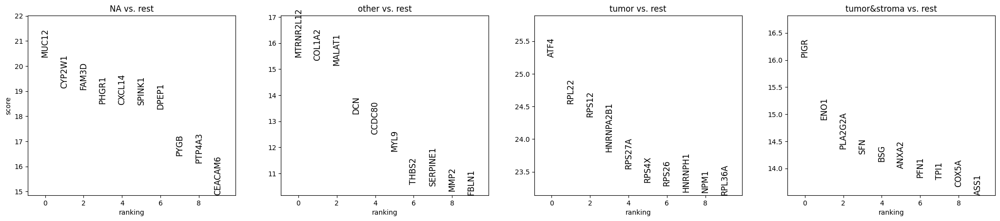

,NA,other,tumor,tumor&stroma
0,MUC12,MTRNR2L12,ATF4,PIGR
1,CYP2W1,COL1A2,RPL22,ENO1
2,FAM3D,MALAT1,RPS12,PLA2G2A
3,PHGR1,DCN,HNRNPA2B1,SFN
4,CXCL14,CCDC80,RPS27A,BSG


In [19]:
sc.tl.rank_genes_groups(adata_liver_neg, groupby='region', method='wilcoxon',
                       n_genes=25, use_raw=False, layers='log1p_n_genes_by_counts')

sc.pl.rank_genes_groups(adata_liver_neg, n_genes=10, sharey=False,
                        fontsize=12)

pd.DataFrame(adata_liver_neg.uns['rank_genes_groups']['names']).head(5)

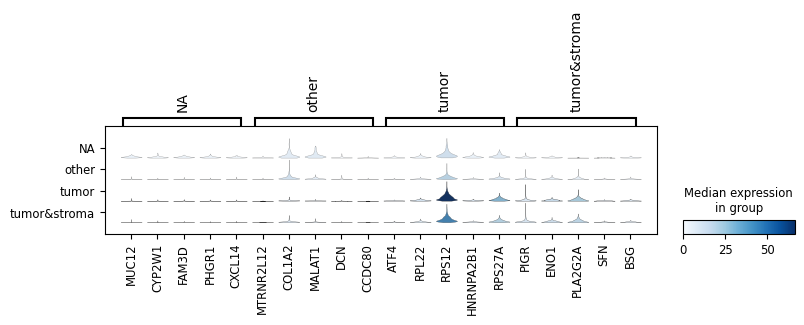

In [20]:
sc.pl.rank_genes_groups_stacked_violin(adata_liver_neg,
                              n_genes=5, dendrogram=False, use_raw=False)

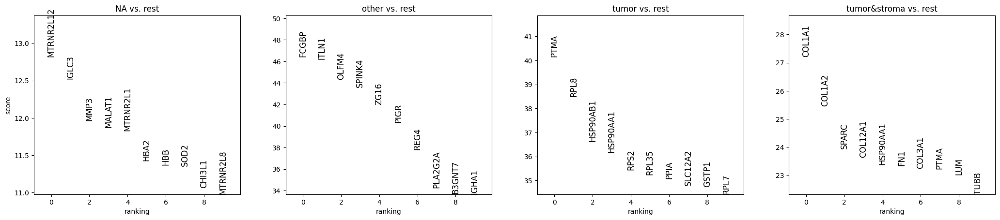

,NA,other,tumor,tumor&stroma
0,MTRNR2L12,FCGBP,PTMA,COL1A1
1,IGLC3,ITLN1,RPL8,COL1A2
2,MMP3,OLFM4,HSP90AB1,SPARC
3,MALAT1,SPINK4,HSP90AA1,COL12A1
4,MTRNR2L1,ZG16,RPS2,HSP90AA1


In [ ]:
sc.tl.rank_genes_groups(adata_liver_met, groupby='region', method='wilcoxon',
                       n_genes=25, use_raw=False, layers='log1p_n_genes_by_counts')

sc.pl.rank_genes_groups(adata_liver_met, n_genes=10, sharey=False,
                        fontsize=12)

pd.DataFrame(adata_liver_met.uns['rank_genes_groups']['names']).head(5)

In [ ]:
# tumor region vs tumor-stroma regions vs other
adata_tumor = adata_annot[adata_annot.obs['region'] == 'tumor'].copy()
adata_tumorstroma = adata_annot[adata_annot.obs['region'] == 'tumor&stroma'].copy()
adata_other = adata_annot[adata_annot.obs['region'] == 'other'].copy()

In [ ]:
from cell2location import run_colocation
tumor_res_dict, adata_tumor = run_colocation(
    adata_tumor,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/tumor_region_all/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_3208locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_3208locations_40factors


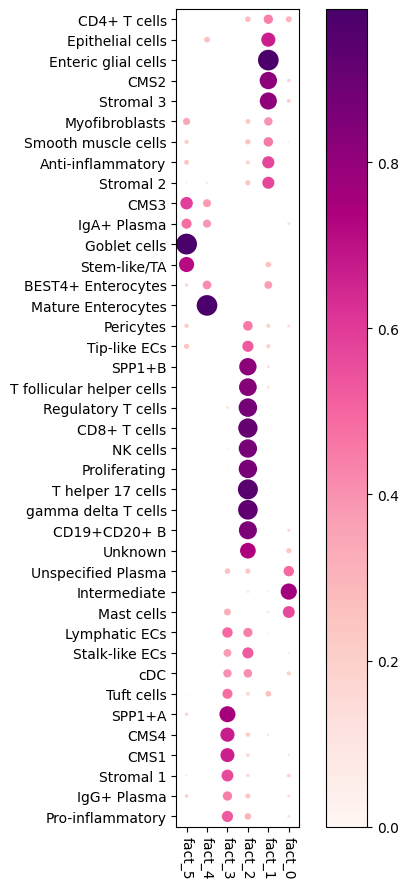

In [ ]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
tumor_res_dict['n_fact6']['mod'].plot_cell_type_loadings()

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_3085locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_3085locations_40factors


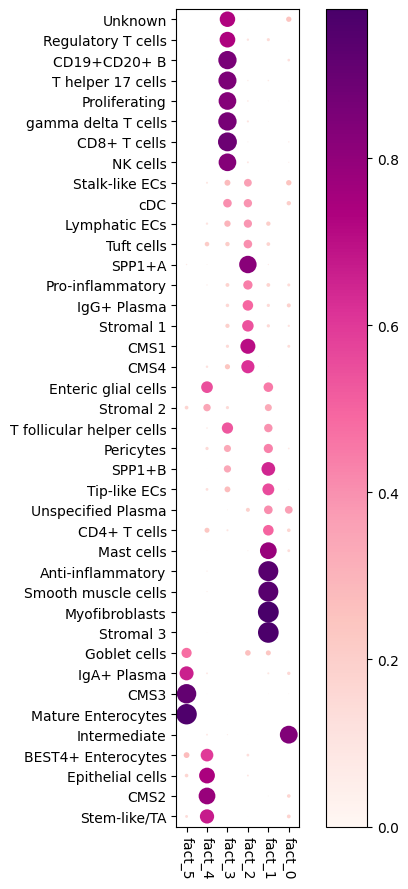

In [ ]:
from cell2location import run_colocation
tumorstroma_res_dict, adata_tumorstroma = run_colocation(
    adata_tumorstroma,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/tumor_stroma_region_all/'}
)
tumorstroma_res_dict['n_fact6']['mod'].plot_cell_type_loadings()

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_10023locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_10023locations_40factors


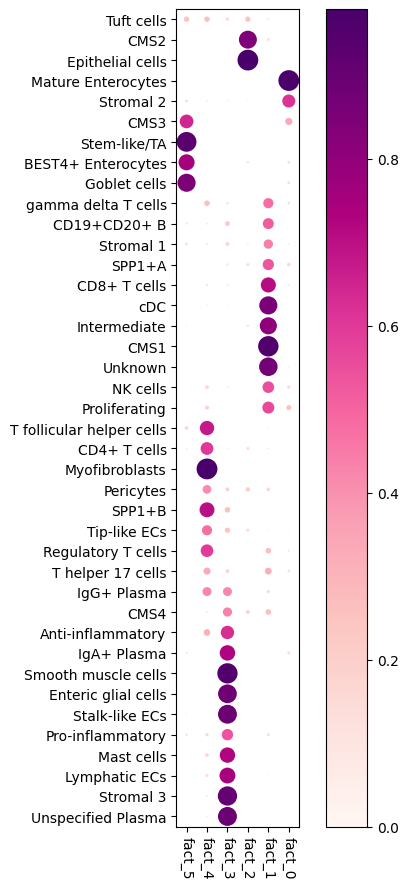

In [ ]:
from cell2location import run_colocation
other_res_dict, adata_other = run_colocation(
    adata_other,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/tumor_other_all/'}
)
other_res_dict['n_fact6']['mod'].plot_cell_type_loadings()

In [24]:
# tumor region vs tumor-stroma regions by lymph node/liver met

adata_tumor_LN = adata_liver_neg[adata_liver_neg.obs['region'] == 'tumor'].copy()
adata_tumorstroma_LN = adata_liver_neg[adata_liver_neg.obs['region'] == 'tumor&stroma'].copy()

adata_tumor_liver = adata_liver_met[adata_liver_met.obs['region'] == 'tumor'].copy()
adata_tumorstroma_liver = adata_liver_met[adata_liver_met.obs['region'] == 'tumor&stroma'].copy()


### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_1566locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_1566locations_40factors


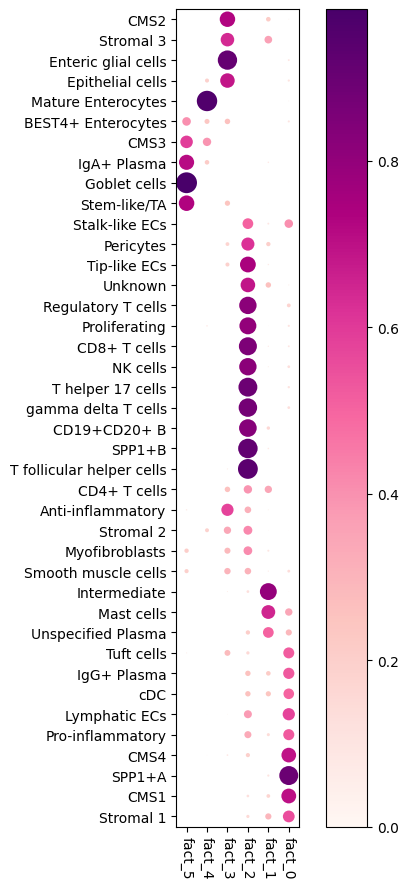

In [22]:
# tumor LN

from cell2location import run_colocation
tumor_LN_res_dict, adata_tumor_LN = run_colocation(
    adata_tumor_LN,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/tumor_other_all/'}
)
tumor_LN_res_dict['n_fact6']['mod'].plot_cell_type_loadings()

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_1804locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_1804locations_40factors


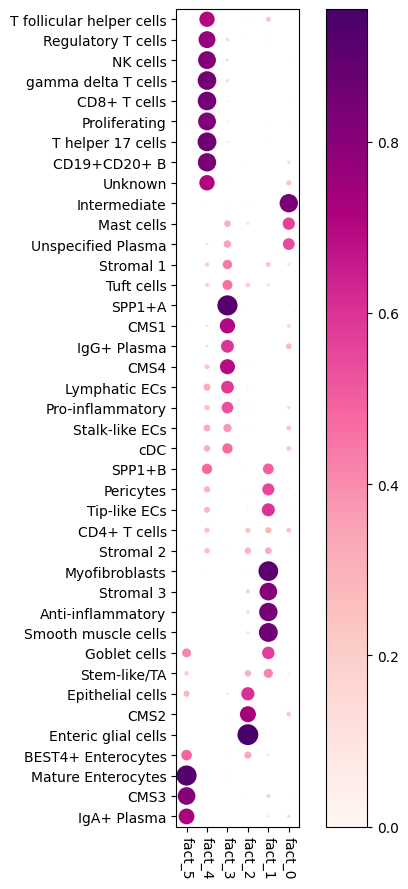

In [23]:
# tumor&stroma LN

from cell2location import run_colocation
tumorstroma_LN_res_dict, adata_tumorstroma_LN = run_colocation(
    adata_tumorstroma_LN,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/tumor_other_all/'}
)
tumorstroma_LN_res_dict['n_fact6']['mod'].plot_cell_type_loadings()

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_1479locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_1479locations_40factors


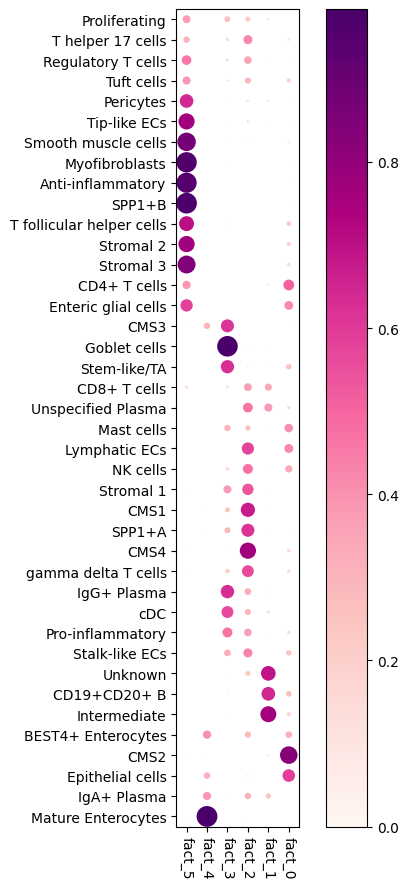

In [25]:
# tumor liver

from cell2location import run_colocation
tumor_liver_res_dict, adata_tumor_liver = run_colocation(
    adata_tumor_liver,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/tumor_other_all/'}
)
tumor_liver_res_dict['n_fact6']['mod'].plot_cell_type_loadings()

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_1100locations_40factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_1100locations_40factors


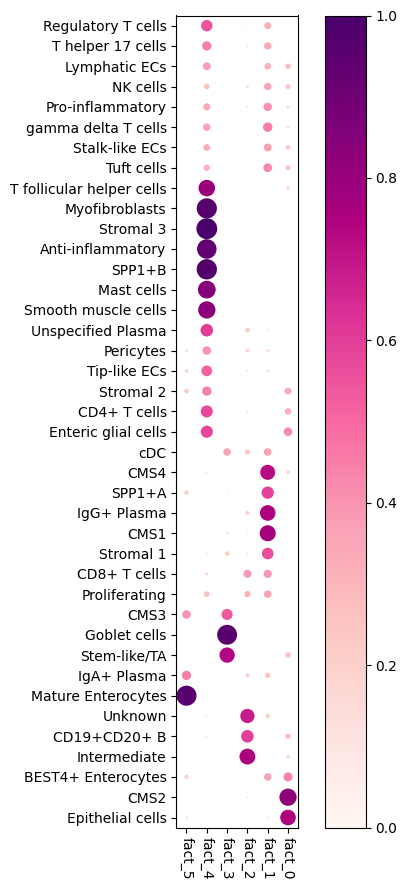

In [26]:
# tumor&stroma liver

from cell2location import run_colocation
tumorstroma_liver_res_dict, adata_tumorstroma_liver = run_colocation(
    adata_tumorstroma_liver,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5,7), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/tumor_other_all/'}
)
tumorstroma_liver_res_dict['n_fact6']['mod'].plot_cell_type_loadings()